In [16]:
import geopandas as gpd
import pandas as pd
import pathlib

import matplotlib.pyplot as plt

from cartopy import crs as ccrs

import os
import sys
import subprocess
import datetime
import platform
import datetime

In [17]:
la = gpd.read_file('BaseMap/geo_export_acfd72fc-caf9-4919-b678-e0d2c103c712.shp')

In [18]:
la.head()

,ct10,geoid10,label,shape_area,shape_len,x_center,y_center,geometry
0,911001,06037911001,9110.01,4.025736e+09,353933.808192,6620403.0,1998891.0,"POLYGON ((-117.66712 34.55801, -117.66712 34.5..."
1,980003,06037980003,9800.03,2.078690e+09,273188.863210,6575300.0,2112006.0,"POLYGON ((-117.88061 34.76362, -117.88251 34.7..."
2,930301,06037930301,9303.01,1.111802e+10,628603.531323,6603027.0,1932124.0,"POLYGON ((-117.65524 34.39722, -117.65518 34.3..."
3,573003,06037573003,5730.03,4.824002e+06,9050.008458,6500215.0,1747305.0,"POLYGON ((-118.19923 33.79712, -118.19923 33.7..."
4,297602,06037297602,2976.02,6.697031e+06,12308.315385,6473372.0,1719119.0,"POLYGON ((-118.28798 33.72258, -118.28798 33.7..."


<AxesSubplot:>

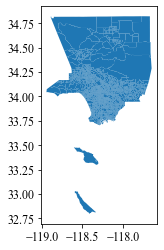

In [19]:
la.plot()

In [20]:
la.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [21]:
la = la[['geoid10','geometry']]

In [22]:
for i in range(len(la)):
    if la.loc[i,'geoid10'] == '06037599100' or la.loc[i,'geoid10'] == '06037599000':
        la.drop([i],inplace = True)

<AxesSubplot:>

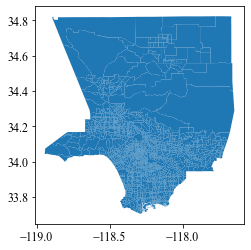

In [23]:
la.plot()

# Exposure

In [24]:
ex = pd.read_csv('exposure_census.csv', dtype = {"GEOID":str,"GEO_ID":str})
ex.head()

,Unnamed: 0,Unnamed: 0.1,State,Price,AFFGEOID,GEOID,fuel,GEO_ID,NAME,HH_num_total,median_income,exposure,min_max_ex
0,0,0,9,2.229,1400000US09001022000,09001022000,1057.581145,9001022000,"Census Tract 220, Fairfield County, Connecticut",1020,82753.0,0.028487,0.055157
1,1,1,9,2.229,1400000US09001042500,09001042500,1175.059270,9001042500,"Census Tract 425, Fairfield County, Connecticut",1465,129821.0,0.020176,0.035431
2,2,2,9,2.229,1400000US09001043500,09001043500,1108.900146,9001043500,"Census Tract 435, Fairfield County, Connecticut",933,104417.0,0.023672,0.043729
3,3,3,9,2.229,1400000US09001010700,09001010700,591.341144,9001010700,"Census Tract 107, Fairfield County, Connecticut",1682,61667.0,0.021374,0.038277
4,4,4,9,2.229,1400000US09001021500,09001021500,561.379578,9001021500,"Census Tract 215, Fairfield County, Connecticut",2094,43357.0,0.028861,0.056045


In [30]:
la_ex = pd.merge(la,ex,left_on='geoid10',right_on="GEOID",how="left")
la_ex

,geoid10,geometry,Unnamed: 0,Unnamed: 0.1,State,Price,AFFGEOID,GEOID,fuel,GEO_ID,NAME,HH_num_total,median_income,exposure,min_max_ex
0,06037911001,"POLYGON ((-117.66712 34.55801, -117.66712 34.5...",64479.0,64479.0,6.0,2.915,1400000US06037911001,06037911001,1228.897646,6037911001,"Census Tract 9110.01, Los Angeles County, Cali...",1516.0,53830.0,0.066547,0.145492
1,06037980003,"POLYGON ((-117.88061 34.76362, -117.88251 34.7...",64747.0,64747.0,6.0,2.915,1400000US06037980003,06037980003,475.082754,6037980003,"Census Tract 9800.03, Los Angeles County, Cali...",0.0,NaN,NaN,NaN
2,06037930301,"POLYGON ((-117.65524 34.39722, -117.65518 34.3...",63541.0,63541.0,6.0,2.915,1400000US06037930301,06037930301,1212.110436,6037930301,"Census Tract 9303.01, Los Angeles County, Cali...",195.0,84219.0,0.041954,0.087121
3,06037573003,"POLYGON ((-118.19923 33.79712, -118.19923 33.7...",65197.0,65197.0,6.0,2.915,1400000US06037573003,06037573003,1070.644465,6037573003,"Census Tract 5730.03, Los Angeles County, Cali...",622.0,69038.0,0.045206,0.094840
4,06037297602,"POLYGON ((-118.28798 33.72258, -118.28798 33.7...",66681.0,66681.0,6.0,2.915,1400000US06037297602,06037297602,1146.253020,6037297602,"Census Tract 2976.02, Los Angeles County, Cali...",1712.0,64873.0,0.051506,0.109792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2338,06037401311,"POLYGON ((-117.81179 34.12544, -117.81171 34.1...",67383.0,67383.0,6.0,2.915,1400000US06037401311,06037401311,1108.900146,6037401311,"Census Tract 4013.11, Los Angeles County, Cali...",2124.0,80811.0,0.040000,0.082484
2339,06037401902,"POLYGON ((-117.71319 34.10698, -117.71319 34.1...",65259.0,65259.0,6.0,2.915,1400000US06037401902,06037401902,586.749807,6037401902,"Census Tract 4019.02, Los Angeles County, Cali...",2676.0,96466.0,0.017730,0.029627
2340,06037401901,"POLYGON ((-117.69963 34.10683, -117.69967 34.1...",67040.0,67040.0,6.0,2.915,1400000US06037401901,06037401901,1069.620799,6037401901,"Census Tract 4019.01, Los Angeles County, Cali...",127.0,79327.0,0.039305,0.080834
2341,06037400602,"POLYGON ((-117.90243 34.13345, -117.90315 34.1...",61563.0,61563.0,6.0,2.915,1400000US06037400602,06037400602,1070.644465,6037400602,"Census Tract 4006.02, Los Angeles County, Cali...",1289.0,75722.0,0.041216,0.085369


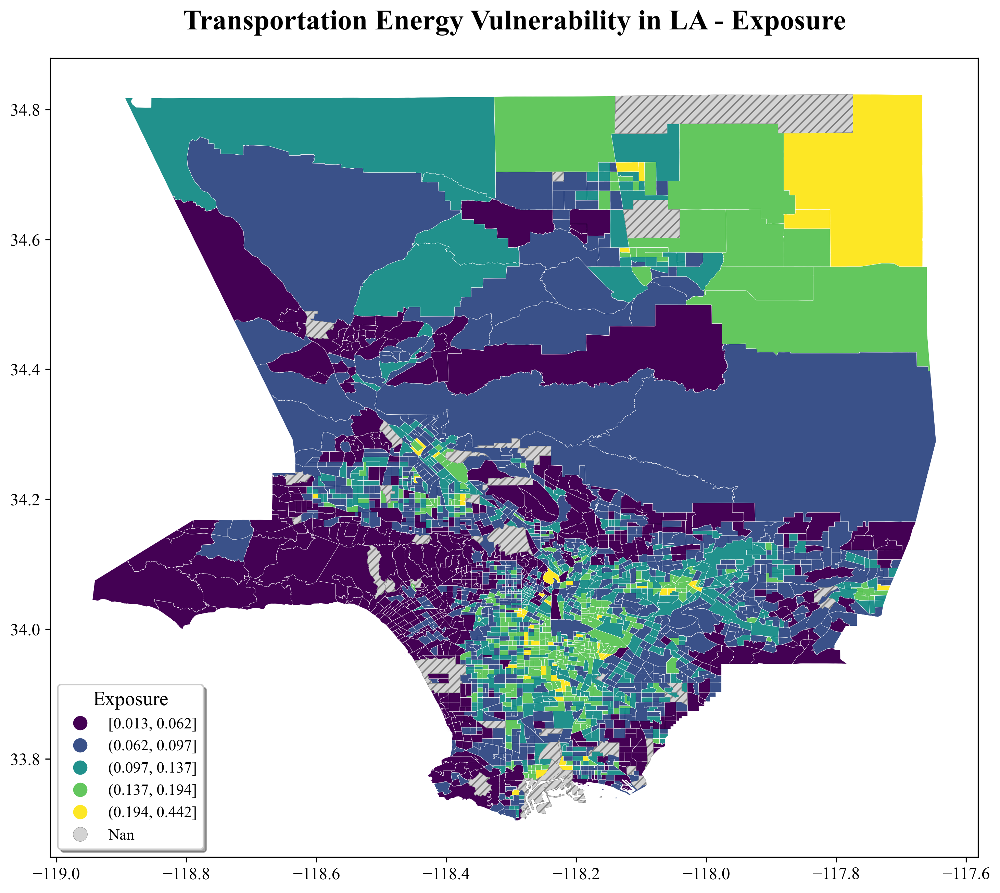

In [31]:
import numpy as np

fig, ax = plt.subplots(figsize=(12, 10),dpi=300)

font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_ex.plot(
    column='min_max_ex',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     k=7,
    legend_kwds={'loc': 'lower left',
                 'title': 'Exposure',
                 "fmt": "{:.3f}",
                 'title_fontsize': 14, 
                 'fontsize': 11, 
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor='white', #,np.array([0., 0., 0., 0.])
    linewidth=0.2
)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in LA - Exposure',fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('LA_exposure_map.png', facecolor='w', dpi=500)

# Sensitivity

In [28]:
sensitivity = pd.read_csv("sensitivity_census.csv", dtype={"Geocode": str})
sensitivity.head()

,Unnamed: 0,Unnamed: 0.1,Geocode,X1,X2,X3,X4,X5,X6,X7,Sensitivity,z_score_sens,min_max_sens
0,0,0,01001020100,0.166583,0.4378,0.113397,0.009533,0.717010,0.132464,0.188660,0.252207,-0.345779,0.470402
1,1,1,01001020200,0.166922,0.3305,0.582440,0.004594,0.639612,0.144972,0.196018,0.295008,0.444644,0.550234
2,2,2,01001020300,0.172512,0.2927,0.260051,0.066439,0.706872,0.160251,0.201882,0.265815,-0.094468,0.495784
3,3,3,01001020400,0.046416,0.3711,0.070397,0.000000,0.751160,0.244714,0.167870,0.235951,-0.645974,0.440083
4,4,4,01001020500,0.149207,0.3735,0.192337,0.030294,0.837958,0.138071,0.198282,0.274236,0.061032,0.511489


In [29]:
la_sens = pd.merge(la,sensitivity,left_on='geoid10',right_on="Geocode",how="left")
la_sens.head()

,geoid10,geometry,Unnamed: 0,Unnamed: 0.1,Geocode,X1,X2,X3,X4,X5,X6,X7,Sensitivity,z_score_sens,min_max_sens
0,06037911001,"POLYGON ((-117.66712 34.55801, -117.66712 34.5...",6985.0,6985.0,06037911001,0.193836,0.3192,0.044575,0.357106,0.758278,0.262354,0.160214,0.299366,0.525119,0.558361
1,06037980003,"POLYGON ((-117.88061 34.76362, -117.88251 34.7...",7050.0,7050.0,06037980003,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.003305,0.000000
2,06037930301,"POLYGON ((-117.65524 34.39722, -117.65518 34.3...",7047.0,7047.0,06037930301,0.118090,0.3738,0.158291,0.177136,0.762563,0.192211,0.043970,0.260866,-0.185868,0.486553
3,06037573003,"POLYGON ((-118.19923 33.79712, -118.19923 33.7...",6600.0,6600.0,06037573003,0.145958,0.4730,0.072165,0.400434,0.833966,0.127509,0.196961,0.321428,0.932533,0.599510
4,06037297602,"POLYGON ((-118.28798 33.72258, -118.28798 33.7...",5717.0,5717.0,06037297602,0.163819,0.4243,0.045023,0.334961,0.844318,0.190399,0.165446,0.309752,0.716920,0.577733


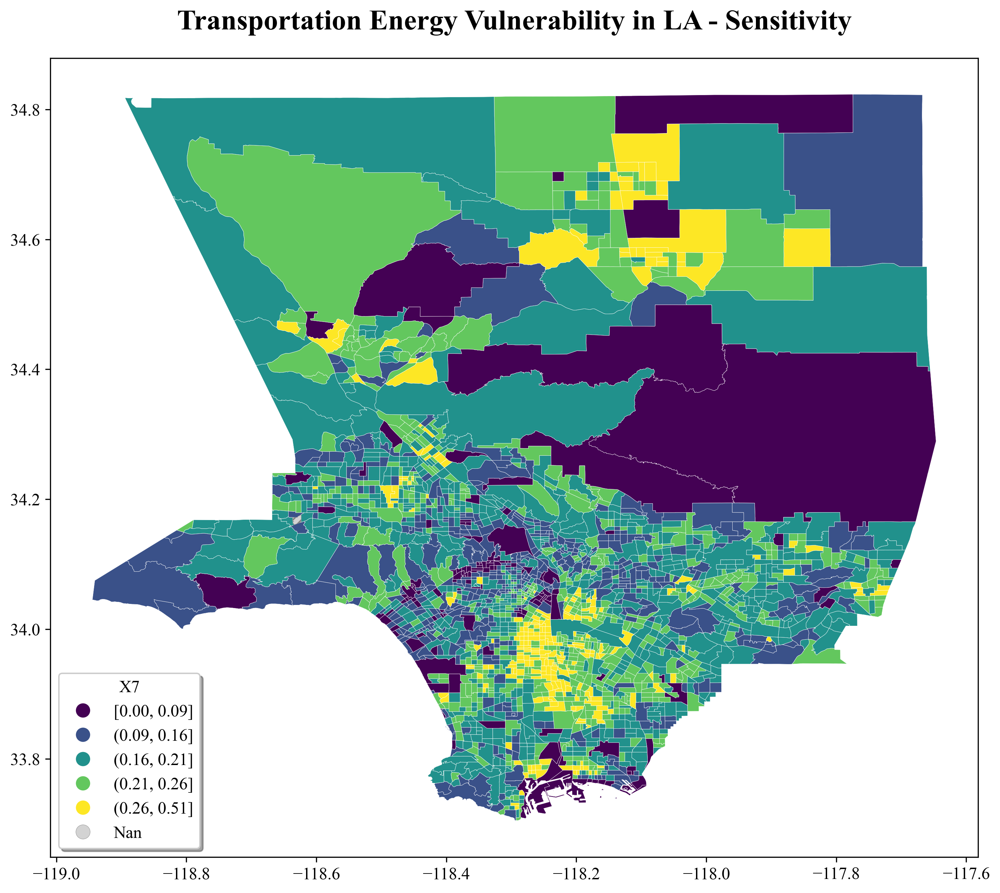

In [39]:
import numpy as np

fig, ax = plt.subplots(figsize=(12, 10),dpi=300)

font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_sens.plot(
    column='X7',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     k=7,
    legend_kwds={'loc': 'lower left',
                 'title': 'X7',
                 'shadow': True
                },
    missing_kwds={
                 "color": "lightgrey",
                 "edgecolor": "grey",
                 "hatch": "////",
                 "label": "Nan"
                  },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2
)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in LA - Sensitivity',fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('LA_X7_map.png', facecolor='w', dpi=500)

# Adaptive Capacity

In [32]:
ac = pd.read_csv("adaptive_capacity_census.csv",dtype={'GEO_ID':str})
ac.head()

,Unnamed: 0,Unnamed: 0.1,GEO_ID,Weighted_D5be,Weighted_D4c,Weighted_D4a,D5be_score,D4c_score,D4a_score,ac,min_max_ac
0,0,0,01001020100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1,01001020200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2,01001020300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,3,01001020400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,4,01001020500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
ac.describe()

,Unnamed: 0,Weighted_D5be,Weighted_D4c,Weighted_D4a,D5be_score,D4c_score,D4a_score,ac,AC_score
count,74102.000000,25521.000000,28063.000000,26565.000000,2.552100e+04,2.806300e+04,26565.000000,25232.000000,25231.000000
mean,37050.500000,11823.800538,82.890421,383.838250,1.508726e-02,1.883588e-02,0.318354,-0.093118,0.350403
std,21391.549161,20314.674988,142.875966,213.202204,2.592168e-02,3.246689e-02,0.176829,0.064544,0.094755
min,0.000000,0.170945,0.003715,0.053756,2.181268e-07,8.442499e-07,0.000045,-0.331732,0.001764
25%,18525.250000,1787.652982,13.259400,225.218649,2.281059e-03,3.013043e-03,0.186795,-0.132475,0.292618
50%,37050.500000,5419.995455,41.765163,346.645394,6.915956e-03,9.490644e-03,0.287506,-0.085345,0.361804
75%,55575.750000,13695.607304,100.305189,508.677700,1.747570e-02,2.279318e-02,0.421895,-0.046635,0.418647
max,74101.000000,783694.330000,4400.666667,1205.697920,1.000000e+00,1.000000e+00,1.000000,0.349266,1.000000


In [33]:
la_ac = pd.merge(la,ac,left_on='geoid10',right_on="GEO_ID",how="left")
la_ac.head()

,geoid10,geometry,Unnamed: 0,Unnamed: 0.1,GEO_ID,Weighted_D5be,Weighted_D4c,Weighted_D4a,D5be_score,D4c_score,D4a_score,ac,min_max_ac
0,06037911001,"POLYGON ((-117.66712 34.55801, -117.66712 34.5...",6984.0,6984.0,06037911001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,06037980003,"POLYGON ((-117.88061 34.76362, -117.88251 34.7...",7050.0,7050.0,06037980003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,06037930301,"POLYGON ((-117.65524 34.39722, -117.65518 34.3...",7046.0,7046.0,06037930301,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,06037573003,"POLYGON ((-118.19923 33.79712, -118.19923 33.7...",6599.0,6599.0,06037573003,9885.010000,19.333333,440.150110,0.012613,0.004393,0.365058,-0.116017,0.316763
4,06037297602,"POLYGON ((-118.28798 33.72258, -118.28798 33.7...",5716.0,5716.0,06037297602,5364.358593,47.569797,338.821393,0.006845,0.010810,0.281017,-0.087787,0.358217


In [49]:
d5bemin = la_ac['Weighted_D5be'].min()
d5bemax = la_ac['Weighted_D5be'].max()
la_ac['D5be_score'] = la_ac.apply(lambda x: (x['Weighted_D5be']-d5bemin)/(d5bemax-d5bemin),axis=1)

In [50]:
d4cmin = la_ac['Weighted_D4c'].min()
d4cmax = la_ac['Weighted_D4c'].max()
la_ac['D4c_score'] = la_ac.apply(lambda x: (x['Weighted_D4c']-d4cmin)/(d4cmax-d4cmin),axis=1)

In [51]:
d4amin = la_ac['Weighted_D4a'].min()
d4amax = la_ac['Weighted_D4a'].max()
la_ac['D4a_score'] = la_ac.apply(lambda x: (x['Weighted_D4a']-d4amin)/(d4amax-d4amin),axis=1)

In [ ]:
la_ac['ac'] = la_ac.apply(lambda x: (x['Weighted_D4a']-d4amin)/(d4amax-d4amin),axis=1)

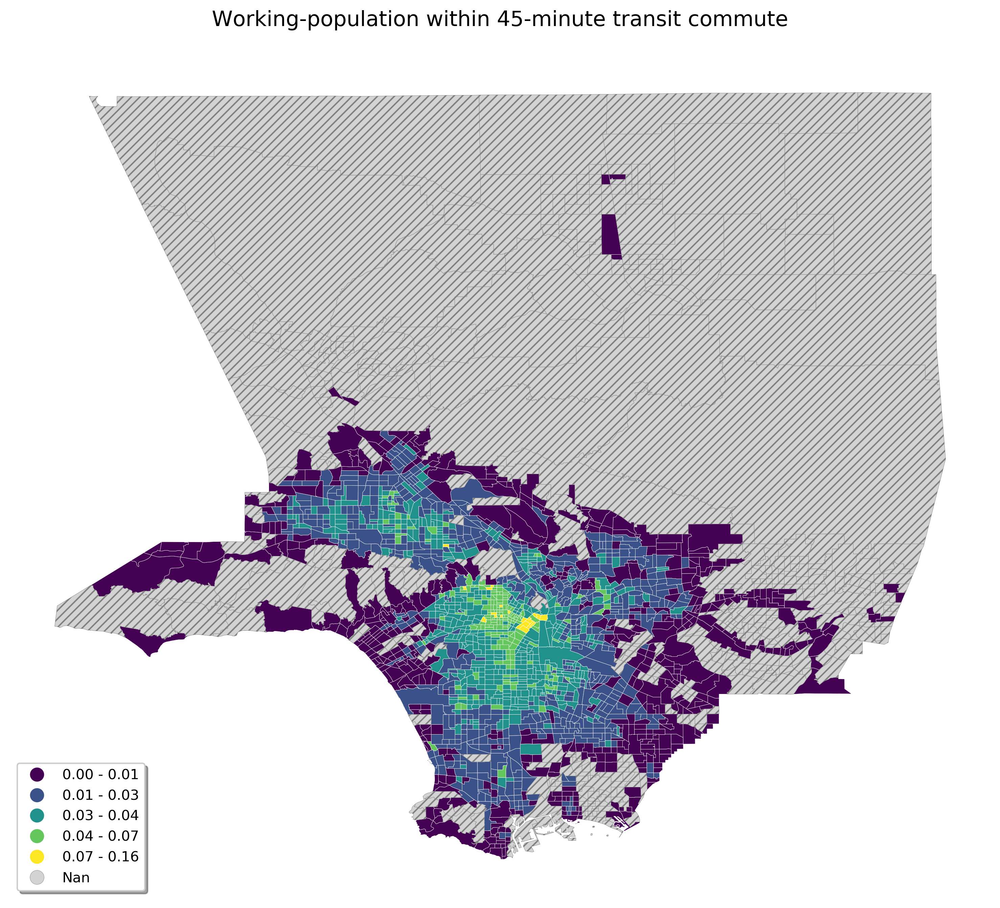

In [39]:
import numpy as np

fig, ax = plt.subplots(figsize=(12, 10),dpi=300)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_ac.plot(
    column='D5be_score',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     k=7,
    legend_kwds={'loc': 'lower left',
                 'title': '',
                 'shadow': True
                },
    missing_kwds={
                 "color": "lightgrey",
                 "edgecolor": "grey",
                 "hatch": "////",
                 "label": "Nan"
                 },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2
)

ax.axis('off')
ax.set_title('Working-population within 45-minute transit commute', fontsize=15,pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('la_D5be_normal_map.png', facecolor='w', dpi=500)

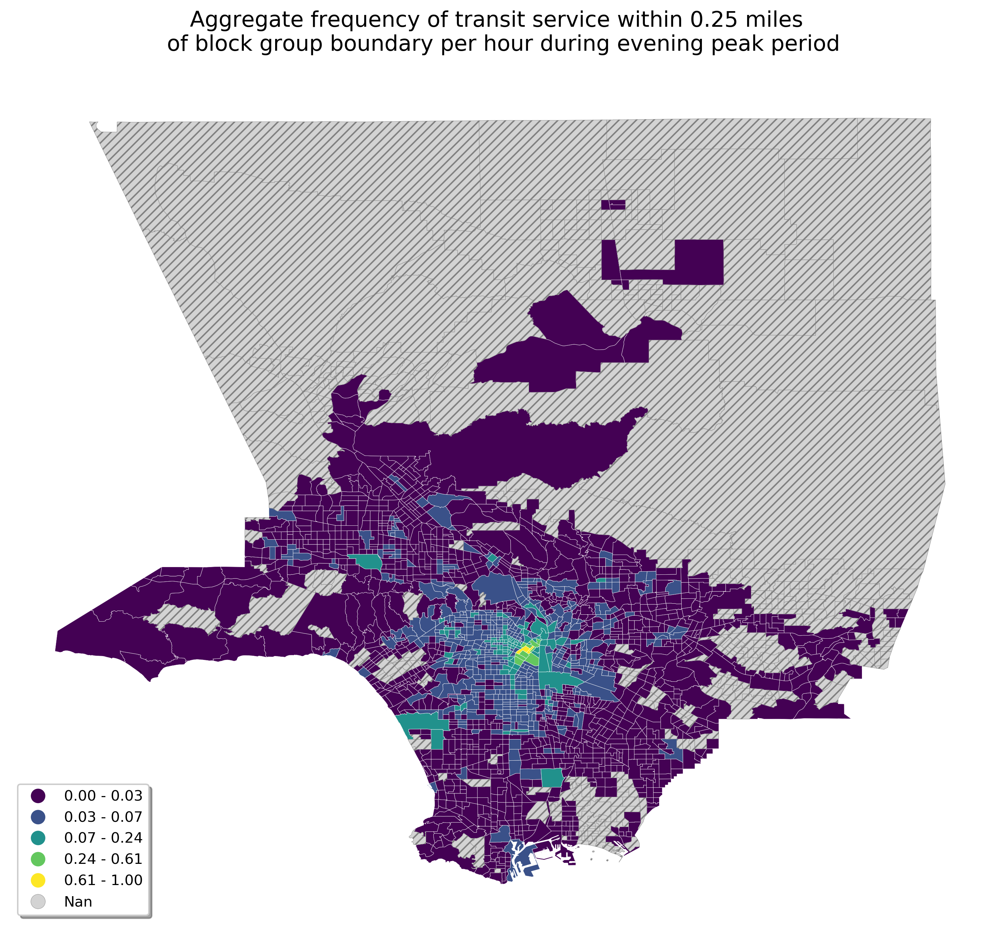

In [40]:
import numpy as np

fig, ax = plt.subplots(figsize=(12, 10),dpi=300)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_ac.plot(
    column='D4c_score',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     k=7,
    legend_kwds={'loc': 'lower left',
                 'title': '',
                 'shadow': True
                },
    missing_kwds={
                 "color": "lightgrey",
                 "edgecolor": "grey",
                 "hatch": "////",
                 "label": "Nan"
                 },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2
)

ax.axis('off')
ax.set_title('Aggregate frequency of transit service within 0.25 miles \n of block group boundary per hour during evening peak period', fontsize=15,pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('la_D4c_normal_map.png', facecolor='w', dpi=500)

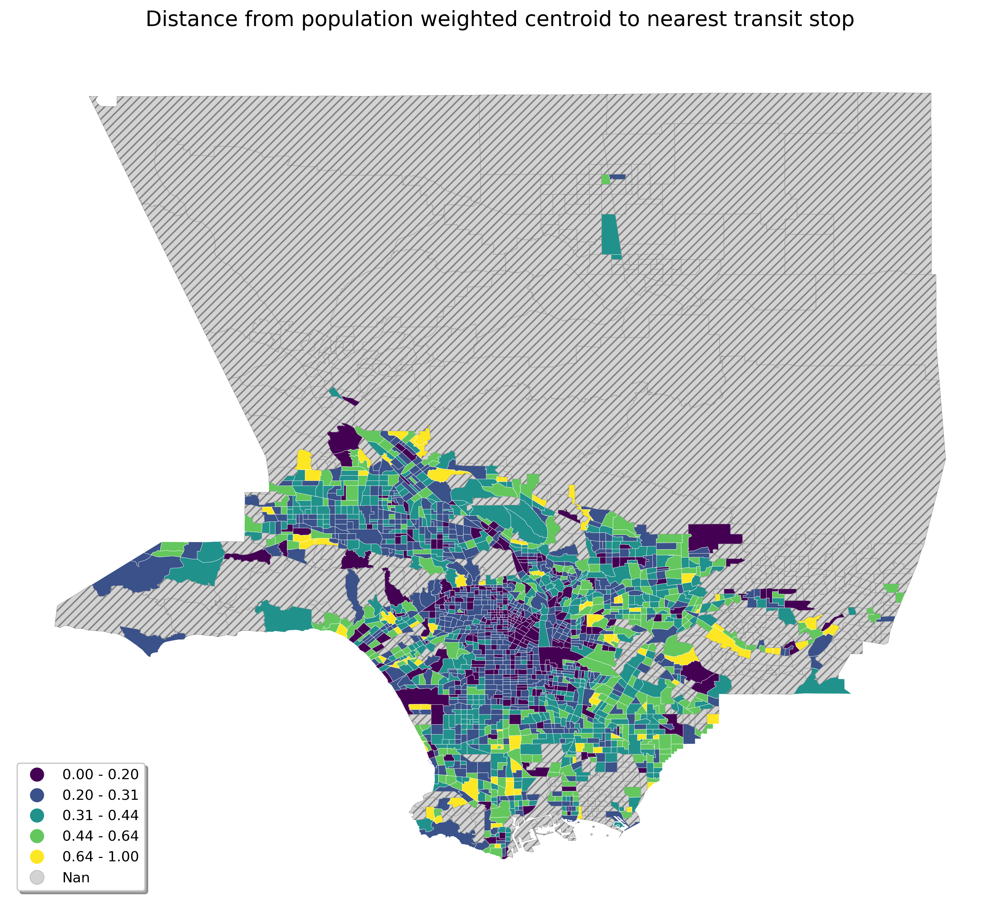

In [41]:


import numpy as np

fig, ax = plt.subplots(figsize=(12, 10),dpi=300)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_ac.plot(
    column='D4a_score',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     k=7,
    legend_kwds={'loc': 'lower left',
                 'title': '',
                 'shadow': True
                },
    missing_kwds={
                 "color": "lightgrey",
                 "edgecolor": "grey",
                 "hatch": "////",
                 "label": "Nan"
                 },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2
)

ax.axis('off')
ax.set_title('Distance from population weighted centroid to nearest transit stop', fontsize=15,pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('la_D4a_normal_map.png', facecolor='w', dpi=500)

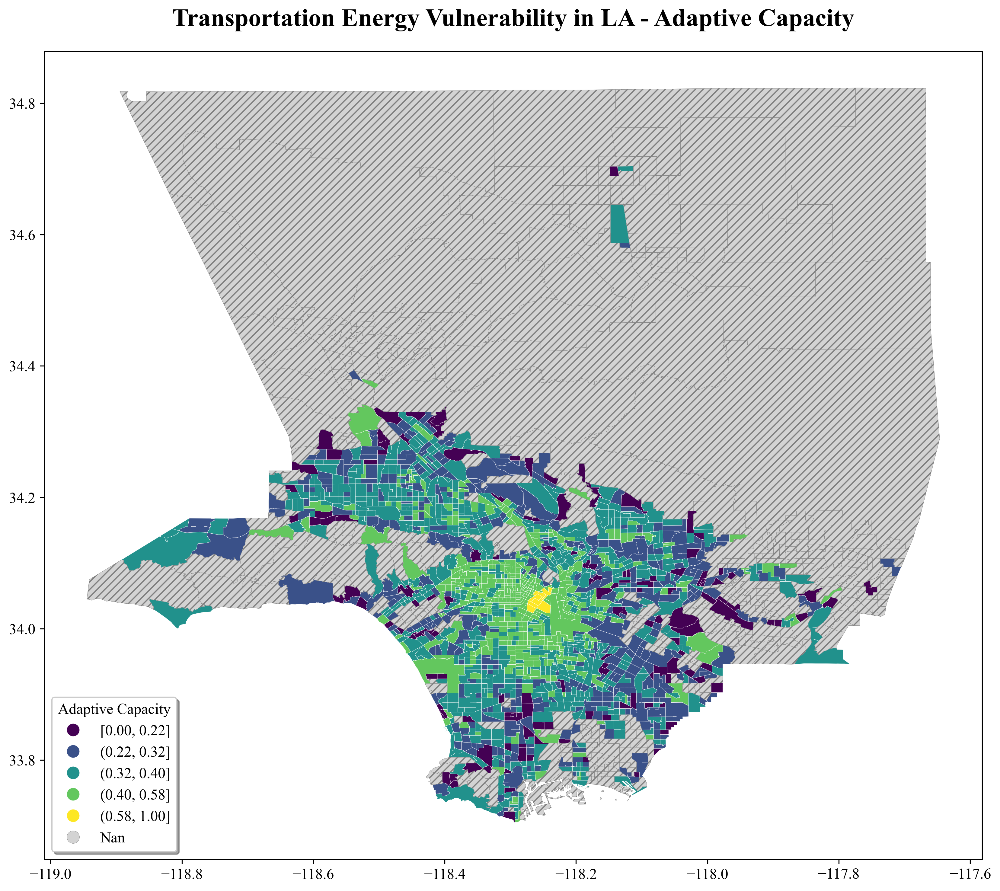

In [34]:
import numpy as np

fig, ax = plt.subplots(figsize=(12, 10),dpi=300)

font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_ac.plot(
    column='min_max_ac',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     k=7,
    legend_kwds={'loc': 'lower left',
                 'title': 'Adaptive Capacity',
                 'shadow': True
                },
    missing_kwds={
                 "color": "lightgrey",
                 "edgecolor": "grey",
                 "hatch": "////",
                 "label": "Nan"
                 },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2
)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in LA - Adaptive Capacity',fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)

ax.set_aspect('equal','box')
fig.tight_layout()

fig.savefig('LA_AC_map.png', facecolor='w', dpi=500)

# Vulnerability Score

In [35]:
vc = pd.read_csv('Vulnerability Score.csv',dtype={'GEOID':str})
vc.head()

,Unnamed: 0,GEOID,min-max,min_max_sens,AC_score,vul_score_mulpi,vul_mulpi_1/3,vul_score_add,vul_add_1/3
0,0,01117030317,0.057365,0.483589,0.000000,0.027741,0.003082,0.540954,0.180318
1,1,01119011500,0.197691,0.693445,0.000000,0.137088,0.015232,0.891136,0.297045
2,2,01121010900,0.116124,0.552217,0.000000,0.064125,0.007125,0.668341,0.222780
3,3,01125010102,0.057489,0.419161,0.000000,0.024097,0.002677,0.476650,0.158883
4,4,01089000701,0.074292,0.708373,0.215956,0.036583,0.004065,0.566710,0.188903


In [36]:
la_vc = pd.merge(la,vc,left_on='geoid10',right_on="GEOID",how="left")
la_vc.head()

,geoid10,geometry,Unnamed: 0,GEOID,min-max,min_max_sens,AC_score,vul_score_mulpi,vul_mulpi_1/3,vul_score_add,vul_add_1/3
0,06037911001,"POLYGON ((-117.66712 34.55801, -117.66712 34.5...",6542.0,06037911001,0.145492,0.558361,0.000000,0.081237,0.009026,0.703854,0.234618
1,06037980003,"POLYGON ((-117.88061 34.76362, -117.88251 34.7...",6810.0,06037980003,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,06037930301,"POLYGON ((-117.65524 34.39722, -117.65518 34.3...",5604.0,06037930301,0.087121,0.486553,0.000000,0.042389,0.004710,0.573674,0.191225
3,06037573003,"POLYGON ((-118.19923 33.79712, -118.19923 33.7...",7260.0,06037573003,0.094840,0.599510,0.316763,0.026816,0.002980,0.377586,0.125862
4,06037297602,"POLYGON ((-118.28798 33.72258, -118.28798 33.7...",8744.0,06037297602,0.109792,0.577733,0.358217,0.024101,0.002678,0.329308,0.109769


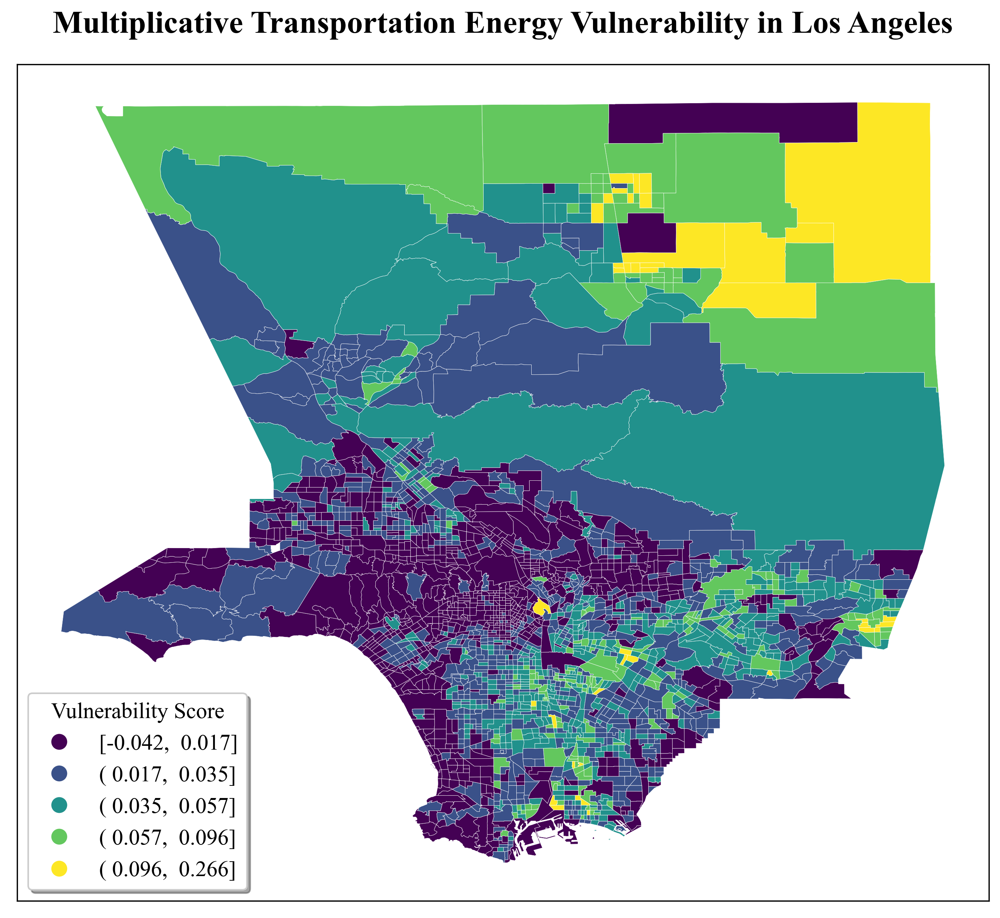

In [47]:
import numpy as np

fig, ax = plt.subplots(figsize=(10, 10),dpi=300)

font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_vc.plot(
    column='vul_score_mulpi',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     scheme='UserDefined',
#     classification_kwds={
#                         'bins': [0, 0.05, 0.1, 0.15, 0.2, 0.25]
#                         },
#     k=7,
    legend_kwds={'loc': 'lower left',
                 'title': 'Vulnerability Score',
                 "fmt": "{:.3f}",   
                 'title_fontsize': 14, 
                 'fontsize': 14, 
                 'shadow': True},
#     missing_kwds={
#                  "color": "lightgrey",
#                  "edgecolor": "grey",
#                  "hatch": "////",
#                  "label": "Nan"
#                  },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2,
#     vmin=vmin, vmax=vmax
)

# ax.axis('on')
plt.xticks([])
plt.yticks([])
ax.set_title('Multiplicative Transportation Energy Vulnerability in Los Angeles', fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('LA_vulnerability_mulpi.png', facecolor='w', dpi=500)

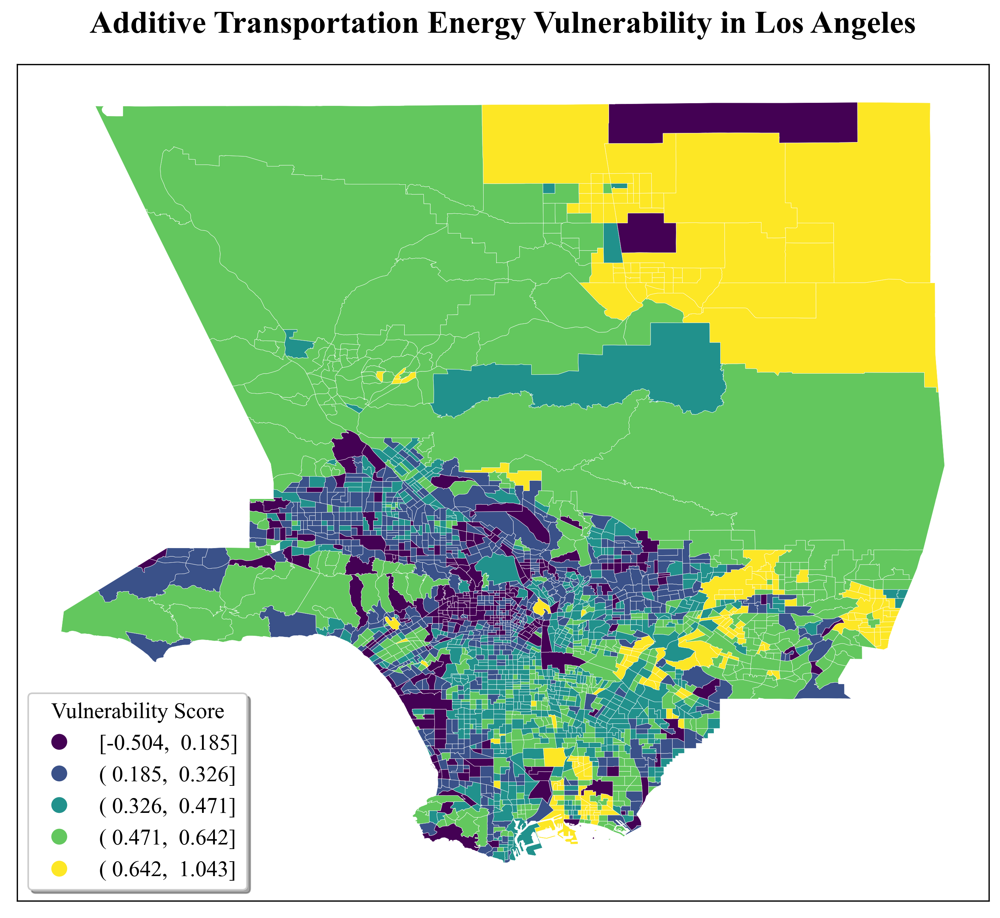

In [48]:
import numpy as np

fig, ax = plt.subplots(figsize=(10, 10),dpi=300)

font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_vc.plot(
    column='vul_score_add',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     scheme='UserDefined',
#     classification_kwds={
#                         'bins': [0, 0.05, 0.1, 0.15, 0.2, 0.25]
#                         },
#     k=7,
    legend_kwds={'loc': 'lower left',
                 'title': 'Vulnerability Score',
                 "fmt": "{:.3f}",
                 
                 'title_fontsize': 14, 
                 'fontsize': 14, 
                 'shadow': True},
#     missing_kwds={
#                  "color": "lightgrey",
#                  "edgecolor": "grey",
#                  "hatch": "////",
#                  "label": "Nan"
#                  },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2,
#     vmin=vmin, vmax=vmax
)

# ax.axis('on')
plt.xticks([])
plt.yticks([])
ax.set_title('Additive Transportation Energy Vulnerability in Los Angeles', fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('LA_vulnerability_add.png', facecolor='w', dpi=500)

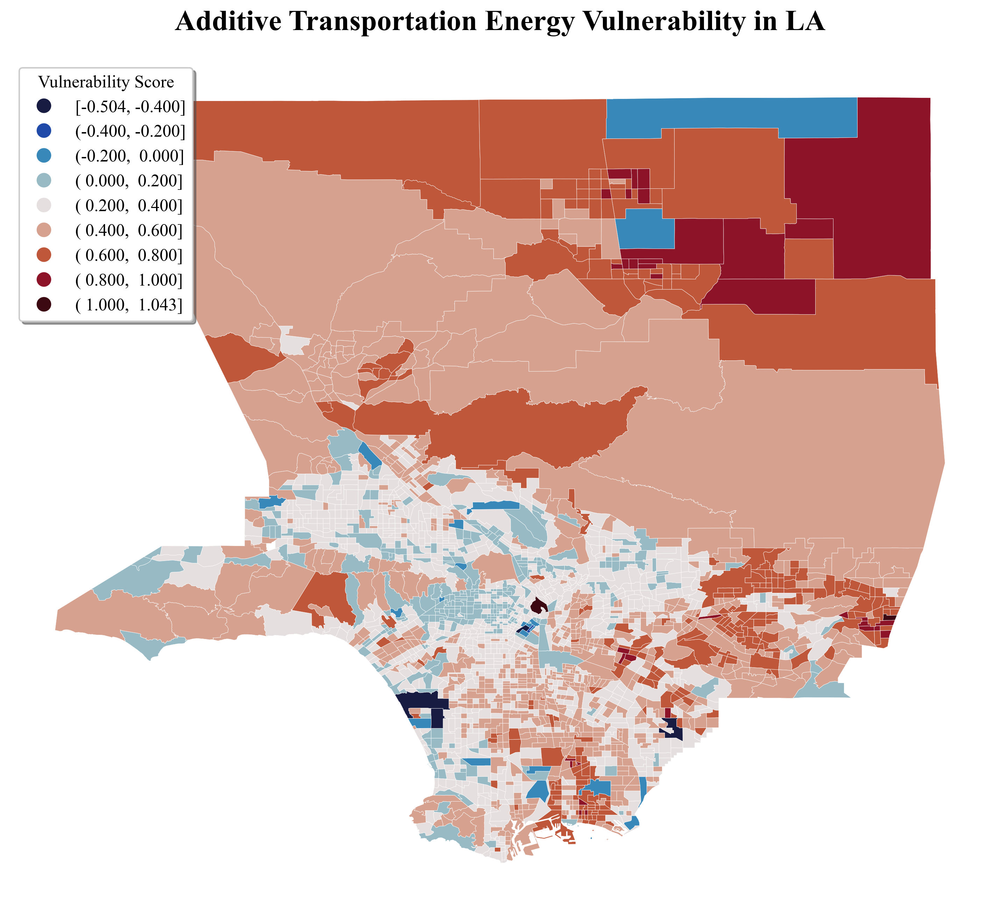

In [40]:
import numpy as np

fig, ax = plt.subplots(figsize=(12, 10),dpi=300)

font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.cmocean.diverging import Balance_20

cmap = Balance_20.mpl_colormap

la_vc.plot(
    column='vul_score_add',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='UserDefined',
    classification_kwds={
                        'bins': [-0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1]
                        },
#     k=7,
    legend_kwds={'loc': 'upper left',
                 'title': 'Vulnerability Score',
                 "fmt": "{:.3f}",
                 'title_fontsize': 12, 
                 'fontsize': 12, 
                 'shadow': True},
#     missing_kwds={
#                  "color": "lightgrey",
#                  "edgecolor": "grey",
#                  "hatch": "////",
#                  "label": "Nan"
#                  },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2
)

ax.axis('off')
ax.set_title('Additive Transportation Energy Vulnerability in LA', fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('LA_vulnerability_test_add.png', facecolor='w', dpi=500)

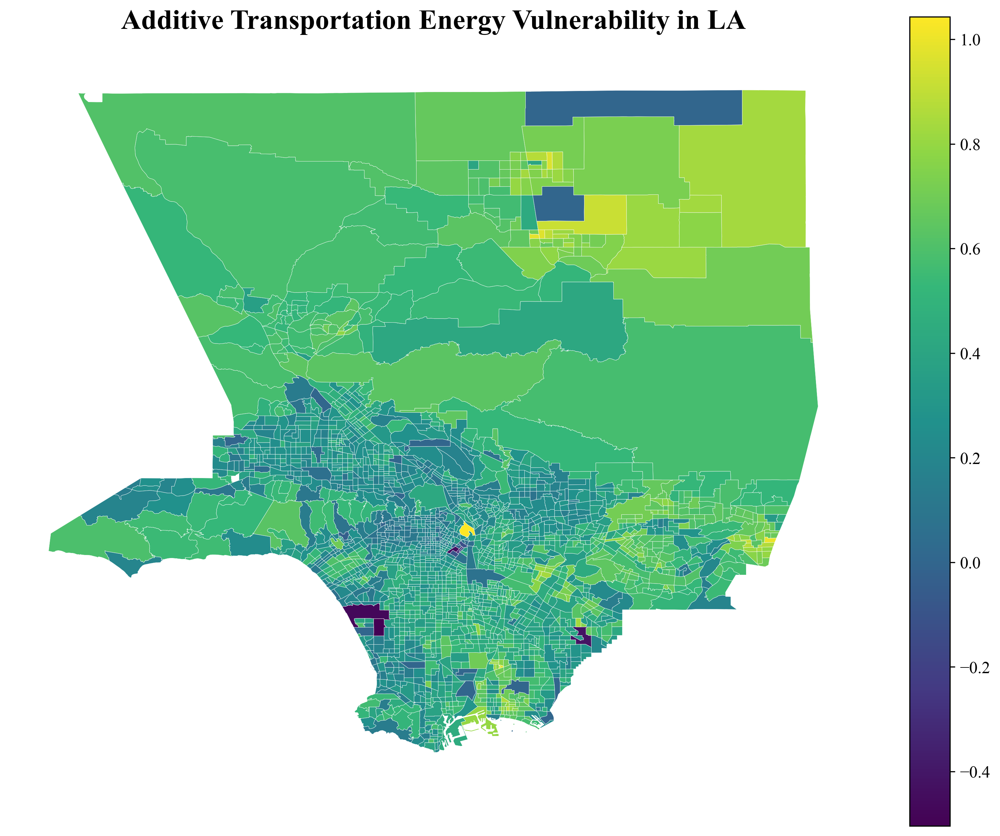

In [30]:
import numpy as np

fig, ax = plt.subplots(figsize=(12, 10),dpi=300)

font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

la_vc.plot(
    column='vul_score_add',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
#     scheme='NaturalBreaks',
# #     k=7,
#     legend_kwds={'loc': 'lower left',
#                  'title': 'Vulnerability Score',
#                  'shadow': True
#                 },
#     missing_kwds={
#                  "color": "lightgrey",
#                  "edgecolor": "grey",
#                  "hatch": "////",
#                  "label": "Nan"
#                  },
#     edgecolor=np.array([0., 0., 0., 0.]),
    edgecolor = 'white',
    linewidth=0.2
)

ax.axis('off')
ax.set_title('Additive Transportation Energy Vulnerability in LA', fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

# fig.savefig('LA_vulnerability_add.png', facecolor='w', dpi=500)

In [39]:
la_ex = la_ex[['geoid10','NAME','min_max_ex']]
la_sens = la_sens[['geoid10','min_max_sens']]
la_ac = la_ac[['geoid10','min_max_ac']]
la_vc = la_vc[['geoid10','vul_score_mulpi','vul_score_add']]
la_all_census  = pd.merge(la_ex, la_sens, on='geoid10')
la_all_census  = pd.merge(la_all_census,la_ac, on='geoid10')
la_all_census  = pd.merge(la_all_census,la_vc, on='geoid10')

In [40]:
la_all_census.to_csv('la_all_census.csv')